# Features

In [1]:
import numpy as np
import cv2 as cv
import cv2
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
from scipy import signal
from IPython.display import display 
from PIL import Image
import nudged
from skimage import transform
%matplotlib inline
from platform import python_version

print(python_version())

3.7.1


## Estimate Geometry

The geometry of the attacked2 image (without image filtering-Folder Attack #2) should be reconstructed based on the halftone version as a reference of the image and the attacked1 image (with image filters-Folder Attack #1). For this aim, there is not any limitation for using available algorithms, functions, and toolbox. After estimating the geometry of the candidate image, the transform matrix should be applied to the attacked2 image. Finally, the measures including SSIM and MSE between original and reconstructed image should be reported. Also, the number of matched points (MP) between images should be reported for each case.

In [2]:
reference_color = cv.imread('./src/Reference.bmp')
reference_gray = cv.cvtColor(reference_color, cv.COLOR_BGR2GRAY)

original_color = cv.imread('./src/Original.bmp')
original_gray = cv.cvtColor(original_color, cv.COLOR_BGR2GRAY)

attack1_1_color = cv.imread('./src/Attack 1/1.bmp')
attack1_1_gray = cv.cvtColor(attack1_1_color, cv.COLOR_BGR2GRAY)

attack1_2_color = cv.imread('./src/Attack 1/2.bmp')
attack1_2_gray = cv.cvtColor(attack1_2_color, cv.COLOR_BGR2GRAY)

attack1_3_color = cv.imread('./src/Attack 1/3.bmp')
attack1_3_gray = cv.cvtColor(attack1_3_color, cv.COLOR_BGR2GRAY)

attack1_4_color = cv.imread('./src/Attack 1/4.bmp')
attack1_4_gray = cv.cvtColor(attack1_4_color, cv.COLOR_BGR2GRAY)

attack2_1_color = cv.imread('./src/Attack 2/1.bmp')
attack2_1_gray = cv.cvtColor(attack2_1_color, cv.COLOR_BGR2GRAY)

attack2_2_color = cv.imread('./src/Attack 2/2.bmp')
attack2_2_gray = cv.cvtColor(attack2_2_color, cv.COLOR_BGR2GRAY)

attack2_3_color = cv.imread('./src/Attack 2/3.bmp')
attack2_3_gray = cv.cvtColor(attack2_3_color, cv.COLOR_BGR2GRAY)

attack2_4_color = cv.imread('./src/Attack 2/4.bmp')
attack2_4_gray = cv.cvtColor(attack2_4_color, cv.COLOR_BGR2GRAY)

In [25]:
warp_mat = cv.getAffineTransform(attack1_1_gray, reference_gray)

error: OpenCV(3.4.2) C:\projects\opencv-python\opencv\modules\imgproc\src\imgwarp.cpp:3163: error: (-215:Assertion failed) src.checkVector(2, 5) == 3 && dst.checkVector(2, 5) == 3 in function 'cv::getAffineTransform'


In [23]:
def get_transform_matrix(img1, img2):
    MIN_MATCH_COUNT = 10
#     orb = cv.ORB_create()
#     kp1, des1 = orb.detectAndCompute(img1,None)
#     kp2, des2 = orb.detectAndCompute(img2,None)
    
    sift = cv.xfeatures2d.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1,None)
    kp2, des2 = sift.detectAndCompute(img2,None)


    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
    search_params = dict(checks = 50)
    flann = cv.FlannBasedMatcher(index_params, search_params)

    matches = flann.knnMatch(np.asarray(des1,np.float32),np.asarray(des2,np.float32),k=2)

    good = []
    for m,n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good)>MIN_MATCH_COUNT:
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
        M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
#     print(M.shape) # (3, 3)
#     print(type(mask)) # ndarray
        transformation_rigid_matrix, rigid_mask = cv.estimateAffinePartial2D(src_pts, dst_pts)
#         print(transformation_rigid_matrix.shape) #(2,3)
#         matchesMask = mask.ravel().tolist()
#         h,w = img1.shape
#         pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
#         dst = cv.perspectiveTransform(pts,M)
#         img2 = cv.polylines(img1,[np.int32(dst)],True,255,3, cv.LINE_AA)
#     else:
#         print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
#         matchesMask = None
    
    
    return M
#     return transformation_rigid_matrix

#     draw_params = dict(matchColor = (0,255,0), # draw matches in green color
#                        singlePointColor = None,
#                        matchesMask = matchesMask, # draw only inliers
#                        flags = 2)
#     img3 = cv.drawMatches(img1,kp1,img2,kp2,good,None,**draw_params)

(4, 1, 2)


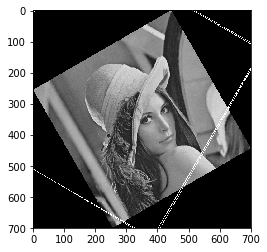

(<matplotlib.image.AxesImage at 0x16e322a4668>, None)

In [24]:
M = get_transform_matrix(attack1_1_gray, reference_gray)
height,width = attack1_1_gray.shape



# dst =cv.transform(attack2_1_gray, M)
        
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv.perspectiveTransform(pts,M)
print(dst.shape)
img2 = cv.polylines(attack2_1_gray,[np.int32(dst)],True,255)
plt.imshow(img2, 'gray'),plt.show()

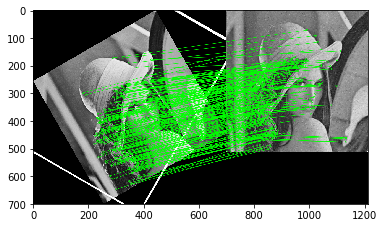

<KeyPoint 0000016E1D65FC00>


In [9]:
MIN_MATCH_COUNT = 10
sift = cv.xfeatures2d.SIFT_create()
kp1, des1 = sift.detectAndCompute(attack1_1_gray,None)
kp2, des2 = sift.detectAndCompute(reference_gray,None)


FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm = FLANN_INDEX_KDTREE, trees = 5)
search_params = dict(checks = 50)
flann = cv.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(np.asarray(des1,np.float32),np.asarray(des2,np.float32),k=2)

good = []
for m,n in matches:
    if m.distance < 0.7*n.distance:
        good.append(m)

if len(good)>MIN_MATCH_COUNT:
    src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
    dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
#     print(M.shape) # (3, 3)
#     print(type(mask)) # ndarray
    matchesMask = mask.ravel().tolist()
    h,w = attack1_1_gray.shape
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv.perspectiveTransform(pts,M)
    img2 = cv.polylines(reference_gray,[np.int32(dst)],True,255,3, cv.LINE_AA)
else:
    print( "Not enough matches are found - {}/{}".format(len(good), MIN_MATCH_COUNT) )
    matchesMask = None

draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                   singlePointColor = None,
                   matchesMask = matchesMask, # draw only inliers
                   flags = 2)
img3 = cv.drawMatches(attack1_1_gray,kp1,img2,kp2,good,None,**draw_params)
plt.imshow(img3, 'gray'),plt.show()
    
print(kp1[0])
# kp1 = np.float32(kp1)
# kp2 = np.float32(kp2)
# retval, mask = cv.findHomography(kp1, kp2)
# retval
# # nkp1 = np.array(kp1)
# # nkp2 = np.array(kp2)
# nkp1 = list(kp1)
# nkp2 = list(kp2)
# trans = nudged.estimate(nkp1, nkp2)
# trans

# bf = cv.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
# matches = bf.match(des1,des2)
# matches = sorted(matches, key = lambda x:x.distance) 
# img3 = cv2.drawMatches(attack1_1_gray,kp1,reference_gray,kp2,matches[:],None, flags=2)
# plt.imshow(img3),plt.show()

# sift = cv.xfeatures2d.SIFT_create()
# kp = sift.detect(attack1_1_gray,None)
# img=cv.drawKeypoints(attack1_1_gray,kp,img)
# display(Image.fromarray(img))

In [12]:
tform = transform.estimate_transform('affine', attack1_1_gray, reference_gray)
np.allclose(tform.inverse(tform(src)), src)

ValueError: matmul: Input operand 1 has a mismatch in its core dimension 0, with gufunc signature (n?,k),(k,m?)->(n?,m?) (size 701 is different from 3)

## Corner Detection

Implement the Harris corner detector algorithm on the image Building. Superimpose the corner points on to the relevant pixels in the image. It is suggested that you choose a suitable threshold to pick up the interest points, followed by a non-maximal suppression step.

### Reading image and converting to gray

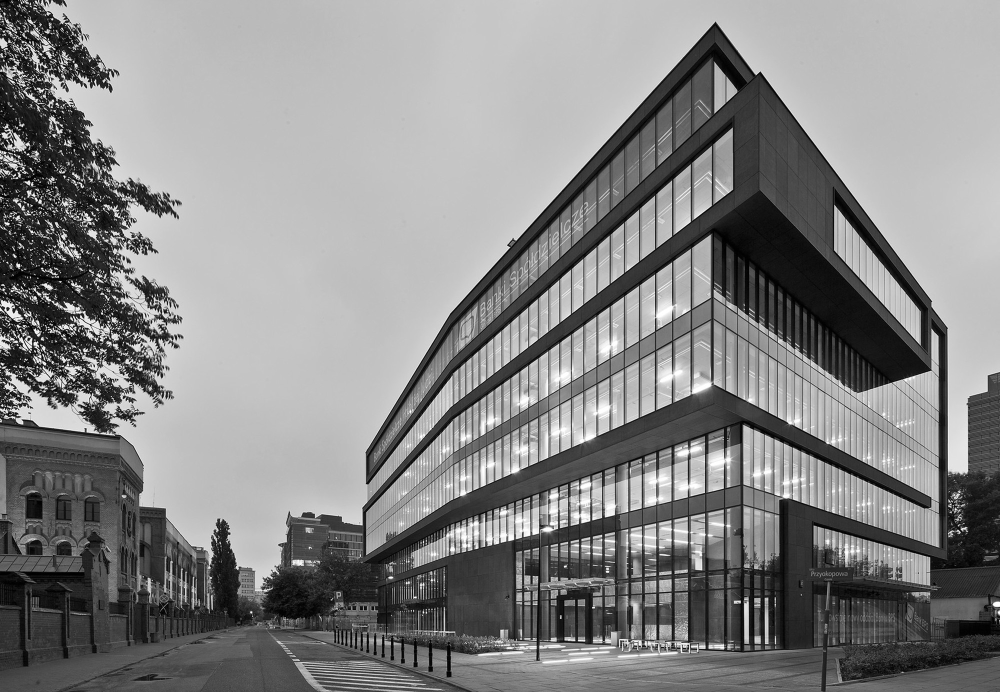

In [10]:
filename='./src/Building.jpg'
src_color = cv.imread(filename)
src_gray = cv.imread(filename, 0)
height, width = src_gray.shape # (1384,2000)

display(Image.fromarray(src_gray))

### Compute Gaussian derivatives at each pixel

In [11]:
kernel_gauss = np.array(([1/16, 2/16, 1/16], [2/16, 4/16, 2/16], [1/16, 2/16, 1/16]), dtype="float64")
filtered_src = signal.convolve2d(src_gray, kernel_gauss, mode='same')

# plt.subplot(121), plt.imshow(src_gray, cmap='gray')
# plt.xticks([]), plt.yticks([])
# plt.title('original')

# plt.subplot(122), plt.imshow(filtered_src, cmap='gray')
# plt.xticks([]), plt.yticks([])
# plt.title('filtered with gaussian kernel')

# plt.show()

# print(src_gray - filtered_src)

### Compute second moment matrix M in a Gaussian window around each pixel

In [12]:
kernel_sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
kernel_sobel_y = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]])

Ix = signal.convolve2d(filtered_src, kernel_sobel_x, mode='same')
Iy = signal.convolve2d(filtered_src, kernel_sobel_y, mode='same')

# plt.imshow(Ix, cmap='gray')
# plt.title('Ix')
# plt.xticks([]), plt.yticks([])
# plt.show()

# plt.imshow(Iy, cmap='gray')
# plt.title('Iy')
# plt.xticks([]), plt.yticks([])
# plt.show()

Ix2 = np.square(Ix)
Iy2 = np.square(Iy)
IxIy = Ix*Iy

# plt.imshow(Ix2, cmap='gray')
# plt.title('Ix2')
# plt.xticks([]), plt.yticks([])
# plt.show()


# plt.imshow(Ixy, cmap='gray')
# plt.title('Ixy')
# plt.xticks([]), plt.yticks([])
# plt.show()

# plt.imshow(Iy2, cmap='gray')
# plt.title('Iy2')
# plt.xticks([]), plt.yticks([])
# plt.show()

g_Ix2 = signal.convolve2d(Ix2, kernel_gauss, mode='same')
g_Iy2 = signal.convolve2d(Iy2, kernel_gauss, mode='same')
g_IxIy = signal.convolve2d(IxIy, kernel_gauss, mode='same')

# plt.imshow(X=Ix_2, cmap='gray')
# plt.title('g(Ix2)') 
# plt.xticks([]), plt.yticks([])

# plt.imshow(X=Ixy, cmap='gray')
# plt.title('g(Ixy)') 
# plt.xticks([]), plt.yticks([])

# plt.imshow(X=Iy_2, cmap='gray')
# plt.title('g(Iy2)') 
# plt.xticks([]), plt.yticks([])

# plt.show()

### Compute corner response function R

In [13]:
alpha = 0.05
R = g_Ix2 * g_Iy2 - np.square(g_IxIy) - alpha * np.square(g_Ix2 + g_Iy2)
# plt.imshow(R, cmap='gray')
# plt.title('R') 
# plt.xticks([]), plt.yticks([])
# plt.show()

### Threshold R

In [8]:
cv.normalize(R, R, 0, 1, cv2.NORM_MINMAX)

threshold = 0.5
loc = np.where(R >= threshold)
key_points = []
for pt in zip(*loc[::-1]):
    key_points.append((pt[1], pt[0]))
#     print(pt[0]) # col
#     break
#     cv.circle(corner_detected_image, pt, 3, (255, 0, 0), -1)

### Find local maxima of response function (non-maximum suppression)

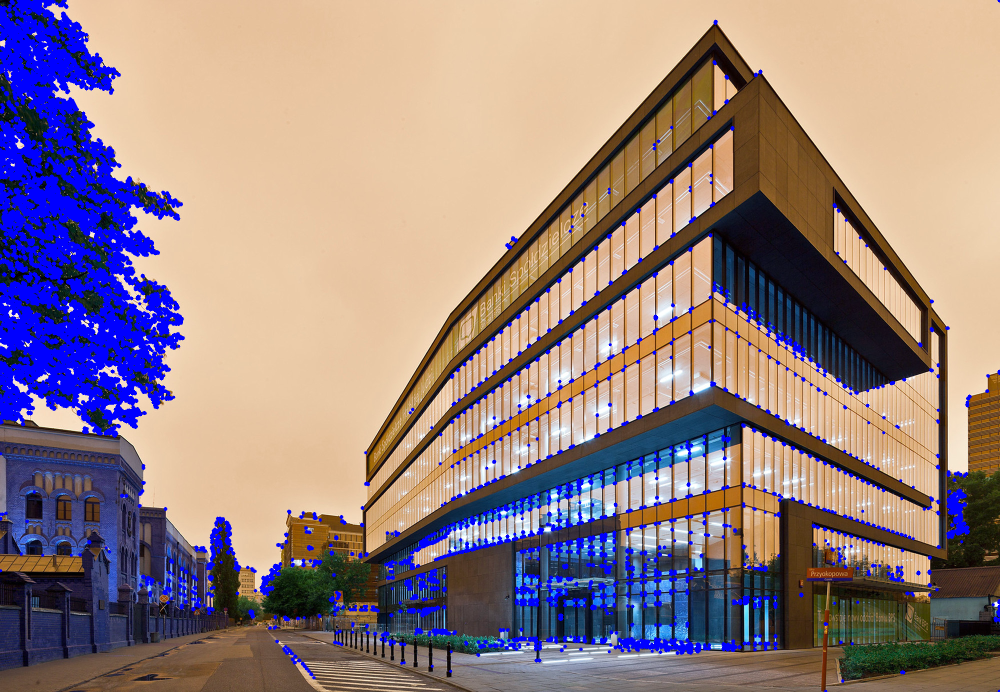

In [14]:
corner_detected_image = np.copy(src_color)
for kp in key_points:
    row = kp[0]
    col = kp[1]
    if R[row, col] > 0:
        cv.circle(corner_detected_image, (col, row), 3, (0, 0, 255), -1)
cv.imwrite('corner_detected_Building.jpg', corner_detected_image)
display(Image.fromarray(corner_detected_image))

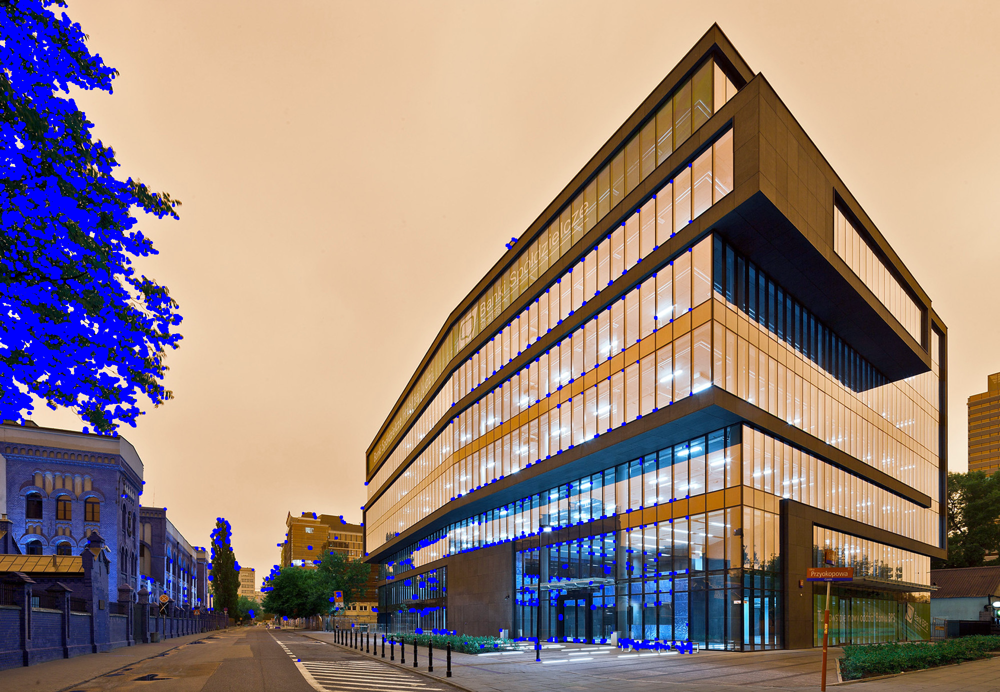

In [15]:
dst = cv.cornerHarris(src_gray, 5, 3, 0.05)

dst = cv.dilate(dst,None)
thresh = 0.1*dst.max()

corner_image = np.copy(src_color)
height, width = dst.shape

for j in range(height):
    for i in range(height):
        if(dst[j,i] > thresh):
            cv.circle(corner_image, (i, j), 1, (0,0,255), 1)

display(Image.fromarray(corner_image))